# Scalable Vector Data Analysis

In this lecture, we are going to use `Dask-GeoPandas` package to read a large vector dataset from [Source Cooperative](https://source.coop/https://source.coop/). Then use Dask parrallel computation to apply a spatial join operation to two geospatial DataFrames. 

Our target dataset is the Google Open Buildings dataset hosted on [Source Cooperative](https://beta.source.coop/repositories/cholmes/google-open-buildings/description/). This is an updated version of the Gooel Open Buildings [dataset](https://sites.research.google/open-buildings/) and it has files in GeoParquet format hosted on AWS S3 bucket. Checkout the description of the dataset to learn more about it [here](https://beta.source.coop/repositories/cholmes/google-open-buildings/description/).

Check out these links to learn more about the open buildings datasets from Google and Microsoft as well:

- [Google Open Buildings](https://sites.research.google/open-buildings/)

- [Microsoft Building Footprints](https://www.microsoft.com/en-us/maps/bing-maps/building-footprints)

- [Google-Microsoft Open Buildings - combined by VIDA](https://beta.source.coop/repositories/vida/google-microsoft-open-buildings/description/)

- Visualize the combined dataset [here](https://observablehq.com/d/d84e078c16baa3ae).






## Download Data

In order to download the data, you need to create a free account on Source Cooperative. Navigate to the [sign in/up page](https://beta.source.coop/auth/login/?return_to=https://beta.source.coop/), and follow the steps to create an account. 

All data on Source Cooperative, are hosted on AWS S3 bucket. In order to access them, you need a temporary credential that you can generate on Source Cooperative website.

Navigate to the Goole Open Building dataset page, and click on "ACCESS DATA". Then click on "GENERATE CREDENTIALS" to retrieve your AWS credentials. Copy the values for each of the following keys, and paste them in the following cell: 

In [1]:
AWS_DEFAULT_REGION = "<REGION>"
AWS_ACCESS_KEY_ID = "ACCESS_KEY_ID"
AWS_SECRET_ACCESS_KEY = "SECRET_ACCESS_KEY"
AWS_SESSION_TOKEN = "SESSION_TOKEN"

We are going to use boto3 package to connect to AWS and download the data:

In [4]:
import boto3

Create a client for s3 access using the credentials you copied from Source Cooperative:

In [5]:
s3 = boto3.client('s3',
                  aws_access_key_id = AWS_ACCESS_KEY_ID, 
                  aws_secret_access_key = AWS_SECRET_ACCESS_KEY, 
                  aws_session_token = AWS_SESSION_TOKEN)

Let's define a function that retrieves the keys of each object on the S3 bucket for Google Open Buildings dataset using the country code. 

A little about S3 (Simple Storage Service):



In [6]:
def get_google_open_building_keys(country_code, aws_region, client):
    """
    This function returns all the S3 keys associated with a country_code
    from the Google Open Building Dataset on Source Cooperative. This function
    only lists the files in GeoParquet format.
    For more information about the dataset, visit 
    https://beta.source.coop/repositories/cholmes/google-open-buildings/description/
    
    
    Args:
        country_code: string indicating the country of target. Country code is
                      the Alpha-2 code based on ISO 3166 standard.
        aws_region: string is the AWS region where the data is hosted
        client: boto3 client object returned by boto3.client
    
    
    Returns:
        keys: list of all keys that match the country_code
    
    """
    
    bucket = f"{aws_region}.opendata.source.coop"
    prefix = f"google-research-open-buildings/geoparquet-by-country/country_iso={country_code}"
    keys = []
    
    kwargs = {'Bucket': bucket, 'Prefix': prefix}
    while True:
        resp = client.list_objects_v2(**kwargs)
        for obj in resp['Contents']:
            keys.append(obj['Key'])

        try:
            kwargs['ContinuationToken'] = resp['NextContinuationToken']
        except KeyError:
            break

    return keys
        

Next we need to select a country. You can look up the ISO name for your country of choice [here](https://www.iso.org/obp/ui/#search)

In [7]:
country_code = "UG" #Uganda is our choice

In [8]:
keys = get_google_open_building_keys(country_code, AWS_DEFAULT_REGION, s3)

In [9]:
keys

['google-research-open-buildings/geoparquet-by-country/country_iso=UG/UG.parquet']

In [10]:
# Download all relevant GeoParquet files
for key in keys:
    s3.download_file(Bucket = f"{AWS_DEFAULT_REGION}.opendata.source.coop",
                 Key = key,
                 Filename = key.split("/")[-1])

## Read Buildings Dataset

In [11]:
import dask_geopandas as dg
import geopandas as gpd

First, we start a new Dask cluster:

In [12]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/halemohammad@clarku.edu/proxy/8787/status,
Dashboard: /user/halemohammad@clarku.edu/proxy/8787/status,Workers: 4
Total threads: 8,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:33079,Workers: 4
Dashboard: /user/halemohammad@clarku.edu/proxy/8787/status,Total threads: 8
Started: Just now,Total memory: 32.00 GiB
Comm: tcp://127.0.0.1:38299,Total threads: 2
Dashboard: /user/halemohammad@clarku.edu/proxy/35205/status,Memory: 8.00 GiB
Nanny: tcp://127.0.0.1:46575,


In [13]:
bldg_ddf = dg.read_parquet(f"{country_code}*.parquet", blocksize = 128)

In [14]:
bldg_ddf.head()

,area_in_meters,confidence,full_plus_code,geometry,quadkey,country_iso
0,15.4232,0.7654,6GMGJW5M+5HGM,"POLYGON ((30.93397 3.60793, 30.93396 3.60796, ...",122323031331,UG
1,22.9853,0.7854,6GMGJW2F+V6WH,"POLYGON ((30.92312 3.60223, 30.92309 3.60227, ...",122323031331,UG
2,26.6149,0.8368,6GMGJW6P+RXM2,"POLYGON ((30.93743 3.61205, 30.93744 3.61210, ...",122323031331,UG
3,16.8751,0.7007,6GMGJW6P+QWWX,"POLYGON ((30.93736 3.61197, 30.93736 3.61201, ...",122323031331,UG
4,18.6629,0.7845,6GMGJW4P+WC3W,"POLYGON ((30.93607 3.60728, 30.93604 3.60730, ...",122323031331,UG


This is a very large DataFrame, and you can see the number of buildings is more than 18M:

In [15]:
len(bldg_ddf)

18277942

In [16]:
bldg_ddf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Read Adminsitrative Boundaries Dataset

We are interested to load the adminsitrative boundaries dataset for Uganda, and assign each building an administrative unit (Parish) name. 

You can download Uganda's administrative unit shapefiles [here](https://gadm.org/download_country.html). We are interested in GeoJSON level 4 data, and the following cell will download it.

In [17]:
! wget -P data/ https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_UGA_4.json.zip

--2023-10-18 15:12:36--  https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_UGA_4.json.zip
Resolving geodata.ucdavis.edu (geodata.ucdavis.edu)... 128.120.146.30
Connecting to geodata.ucdavis.edu (geodata.ucdavis.edu)|128.120.146.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 772826 (755K) [application/zip]
Saving to: ‘data/gadm41_UGA_4.json.zip.2’

gadm41_UGA_4.json.z 100%[===================>] 754.71K   888KB/s    in 0.9s    

2023-10-18 15:12:38 (888 KB/s) - ‘data/gadm41_UGA_4.json.zip.2’ saved [772826/772826]



In [18]:
boundaries = gpd.read_file("data/gadm41_UGA_4.json.zip")

In [19]:
boundaries.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [20]:
boundaries.head()

,GID_4,GID_0,COUNTRY,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry
0,UGA.1.1.1.1_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.1_1,AdjumaniTc,Biyaya,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.80800 3.37270, 31.79310 3.3..."
1,UGA.1.1.1.2_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.1_1,AdjumaniTc,Central,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.79040 3.38700, 31.79050 3.3..."
2,UGA.1.1.1.3_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.1_1,AdjumaniTc,Cesia,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.79010 3.39280, 31.79040 3.3..."
3,UGA.1.1.2.1_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.2_1,Adropi,Esia,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.71120 3.31740, 31.71340 3.3..."
4,UGA.1.1.2.2_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.2_1,Adropi,Jihwa,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.78740 3.46700, 31.78200 3.4..."


## Spatial Join

Now, we will use the spatial join to add the Parish name (`NAME_4` in `boundaries`) to `bldg_ddf`:

In [21]:
bldg_ddf_w_boundaries = bldg_ddf.sjoin(boundaries, how="inner", predicate="intersects")

In [22]:
buildigs_per_parish = bldg_ddf_w_boundaries["NAME_4"].value_counts().compute()

In [23]:
buildigs_per_parish

NAME_4
Kyebando                    58970
CentralWard                 42772
Kichwabugingo               41610
Busabala                    40565
Kasenge                     40309
                            ...  
Nyakiyanja-MaramagamboFr        5
MpangaFr                        5
OtuboiSudds                     3
KyamburaGr                      2
KibaaleFr                       2
Name: count, Length: 4681, dtype: int64

### Task: plot the number of buildings per Parish on a map

In [24]:
boundaries_w_count = boundaries.merge(buildigs_per_parish, on="NAME_4")

In [25]:
boundaries_w_count

,GID_4,GID_0,COUNTRY,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry,count
0,UGA.1.1.1.1_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.1_1,AdjumaniTc,Biyaya,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.80800 3.37270, 31.79310 3.3...",3955
1,UGA.1.1.1.2_1,UGA,Uganda,UGA.1_1,Adjumani,UGA.1.1_1,EastMoyo,UGA.1.1.1_1,AdjumaniTc,Central,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.79040 3.38700, 31.79050 3.3...",19118
2,UGA.7.1.3.1_1,UGA,Uganda,UGA.7_1,Busia,UGA.7.1_1,Samia-Bugwe,UGA.7.1.3_1,BusiaTc,Central,NA,Parish,Parish,NA,"MULTIPOLYGON (((34.09350 0.46350, 34.08820 0.4...",19118
3,UGA.28.1.1.2_1,UGA,Uganda,UGA.28_1,Kotido,UGA.28.1_1,Dodoth,UGA.28.1.1_1,KaabongT.C.,Central,NA,Parish,Parish,NA,"MULTIPOLYGON (((34.13510 3.51400, 34.12630 3.5...",19118
4,UGA.46.1.7.1_1,UGA,Uganda,UGA.46_1,Nakasongola,UGA.46.1_1,Buruli,UGA.46.1.7_1,NakasongolaTc,Central,NA,Parish,Parish,NA,"MULTIPOLYGON (((32.46840 1.33130, 32.47090 1.3...",19118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5332,UGA.58.1.7.3_1,UGA,Uganda,UGA.58_1,Yumbe,UGA.58.1_1,Aringa,UGA.58.1.7_1,Romogi,Limidia,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.27220 3.52460, 31.26550 3.5...",2259
5333,UGA.58.1.7.4_1,UGA,Uganda,UGA.58_1,Yumbe,UGA.58.1_1,Aringa,UGA.58.1.7_1,Romogi,Locomgbo,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.49130 3.51400, 31.45670 3.4...",1987
5334,UGA.58.1.8.1_1,UGA,Uganda,UGA.58_1,Yumbe,UGA.58.1_1,Aringa,UGA.58.1.8_1,YumbeTc,Arunga,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.27170 3.46040, 31.26970 3.4...",6386
5335,UGA.58.1.8.2_1,UGA,Uganda,UGA.58_1,Yumbe,UGA.58.1_1,Aringa,UGA.58.1.8_1,YumbeTc,Charanga,NA,Parish,Parish,NA,"MULTIPOLYGON (((31.22280 3.47170, 31.22530 3.4...",5182


<Axes: >

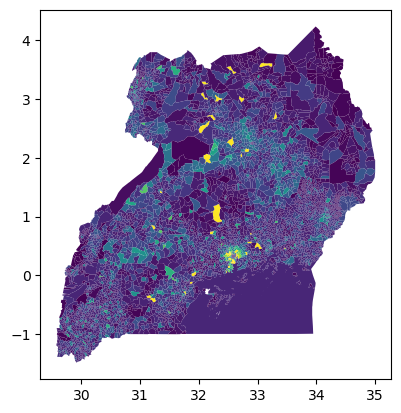

In [ ]:
boundaries_w_count.plot("count", vmax = 30000)

In [27]:
boundaries_w_count.explore("count")

### Task: calculate percentage of the area of each Parish that is covered by buildings. 

In [28]:
bldg_ddf_w_boundaries = bldg_ddf.sjoin(boundaries, how="inner", predicate="intersects")

In [29]:
bldg_area_per_parish = bldg_ddf_w_boundaries.groupby("NAME_4")["area_in_meters"].sum().compute()

In [31]:
boundaries_w_count = boundaries_w_count.merge(bldg_area_per_parish, on="NAME_4")

In [32]:
boundaries_w_count.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

To calculate the correct area of each Parish we need to project the geometries to a CRS that has units of meter. Here we will use `EPSG:32636` which is the UTM Zone for Uganda. 

In [36]:
boundaries_w_count["percent_bldg"] = boundaries_w_count["area_in_meters"] / boundaries_w_count.to_crs(32636).area * 100

In [37]:
boundaries_w_count.explore("percent_bldg", vmax = 10)